In [2]:
using WAV
using FFTW
using Plots

In [58]:
birdfs = wavread("bird.wav")[2]
bird = wavread("bird.wav")[1][:,1];

In [75]:
"""
    freqincrease(signal::Array{Float64,1}, shift::Int64)

Funkcja zwiększa częstotliwość tablicy zawierającej wartości amplitudy w zależności
od czasu (signal) o podaną liczbę cykli (shift).
"""
function freqincrease(signal::Array{Float64,1}, shift::Int64)
    fft_signal = fft(signal)
    amplitude = abs.(fft_signal)
    angle_signal = angle.(fft_signal)
    N = length(fft_signal)
    amp1 = amplitude[2:Int(N/2)+1]                
    angle1 = angle_signal[2:Int(N/2)+1] 
    amp2 = amplitude[Int(N/2)+2:end]
    angle2 = angle_signal[Int(N/2)+2:end] 
    amp1shift   = [zeros(shift); amp1[1:end-shift]]
    angle1shift = [zeros(shift); angle1[1:end-shift]]
    amp2shift   = [amp2[shift+1:end]; zeros(shift)]
    angle2shift = [angle2[shift+1:end]; zeros(shift)]
    amplitude_new = [amplitude[1]; amp1shift; amp2shift]
    angle_new  = [angle_signal[1]; angle1shift; angle2shift]
    x = amplitude_new .* cos.(angle_new)
    y = amplitude_new .* sin.(angle_new)
    fft_new = x + im*y
    return ifft(fft_new)
end
    
    

freqincrease

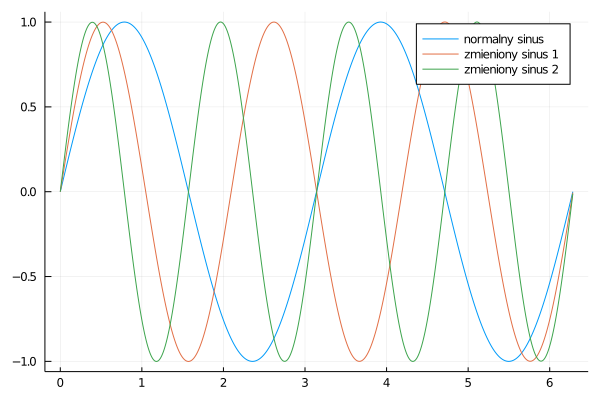

In [59]:
t = range(0, 2pi, length = 1000)
f = sin.(2*t)
plot(t, f, label="normalny sinus")
new_f = real(freqincrease(f, 1))
plot!(t, new_f, label="zmieniony sinus 1")
plot!(t, real(freqincrease(f, 2)), label="zmieniony sinus 2")

In [60]:
newbird = freqincrease(bird, 10000);

In [71]:
plot(real(newbird), label="nowe")
plot!(bird, label="stare", alpha=.7)

In [63]:
wavwrite(real(newbird), "nowyptaszek.wav", Fs=birdfs)

In [72]:
wavplay("nowyptaszek.wav")

In [73]:
wavplay("bird.wav")

In [76]:
"""
    freqincrease(signal::Array{Float64,1}, shift::Int64)

Funkcja zwiększa częstotliwość tablicy zawierającej wartości amplitudy w zależności
od czasu (signal) o podaną liczbę cykli (shift).
"""
function freqreduce(signal::Array{Float64,1}, shift::Int64)
    fft_signal = fft(signal)
    amplitude = abs.(fft_signal)
    angle_signal = angle.(fft_signal)
    N = length(fft_signal)
    amp1 = amplitude[2:Int(N/2)+1]                
    angle1 = angle_signal[2:Int(N/2)+1] 
    amp2 = amplitude[Int(N/2)+2:end]
    angle2 = angle_signal[Int(N/2)+2:end]
    amp1shift   = [amp1[shift+1:end]; zeros(shift)]
    angle1shift = [angle1[shift+1:end]; zeros(shift)]
    amp2shift   = [zeros(shift); amp2[1:end-shift]]
    angle2shift = [zeros(shift); angle2[1:end-shift]]
    amplitude_new = [amplitude[1]; amp1shift; amp2shift]
    angle_new  = [angle_signal[1]; angle1shift; angle2shift]
    x = amplitude_new .* cos.(angle_new)
    y = amplitude_new .* sin.(angle_new)
    fft_new = x + im*y
    return ifft(fft_new)
end

freqreduce

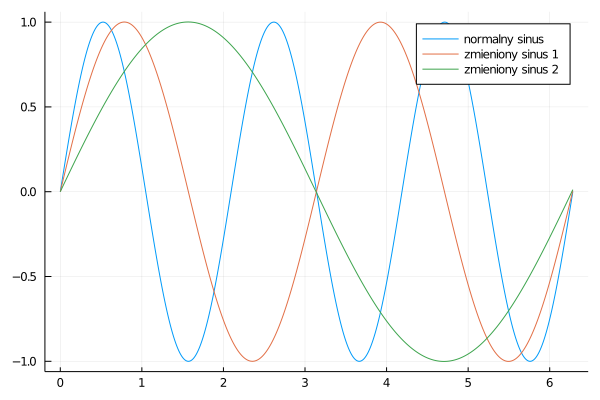

In [67]:
t = range(0, 2pi, length = 1000)
f = sin.(3*t)
plot(t, f, label="normalny sinus")
new_f = real(freqreduce(f, 1))
plot!(t, new_f, label="zmieniony sinus 1")
plot!(t, real(freqreduce(f, 2)), label="zmieniony sinus 2")

In [68]:
wavwrite(real(freqreduce(bird, 5000)), "nowyptaszek2.wav", Fs=birdfs)

In [69]:
wavplay("nowyptaszek2.wav")

In [70]:
plot(real(freqreduce(bird, 5000)), label="nowe", fillalpha=.3)
plot!(bird, label="stare", alpha=.7)